# Generative Adversarial Network (GAN)

Let $x$ be the data representing an image. 


$$
\text{Discriminator}\; D\,(x)
$$


Let $z$ be a latent space vector sampled from a standard normal distribution.

$$
\text{Generator}\; G(z)
$$

The goal is to play a minimax game.

$$
min_G\;max_D\; V(D, G) = \mathbb{E}_{x \sim  p_{data}(x)}\left[\,log\,D(x) \,\right] +
E_{z \sim p_{z}(z)}\left[\, log\,(1 - D(G(z))) \,\right] 
$$



# Deep Convolutional Generative Adversarial Networks (DCGAN)

Objective is to implement [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/pdf/1511.06434.pdf).

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as utils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML
from torchsummary import summary

# Number of GPU to use
NUM_GPU = 1

torch.manual_seed(999)
device = torch.device("cuda:0" if (torch.cuda.is_available() and NUM_GPU > 0) else "cpu")

## Dataset

Download the celebrity face attributes dataset. It's available on Kaggle and PyTorch vision library.

```py
dataset = datasets.CelebA(root='data/celeba',
                          split='train',
                          target_type='attr',
                          transform=None,
                          download=True)
```

In [2]:
dataset = datasets.ImageFolder(root='data/celeba', transform=transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))
dataloader = torch.utils.data.DataLoader(dataset,
                                         batch_size=128,
                                         shuffle=True,
                                         num_workers=2)

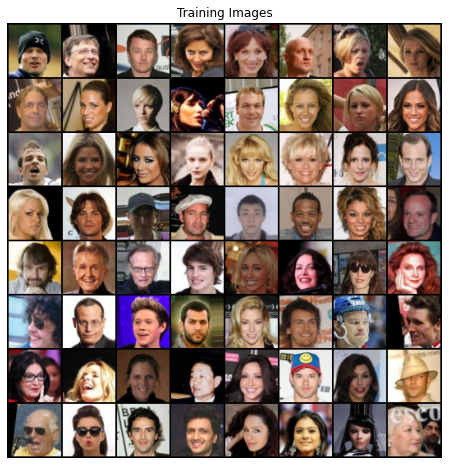

In [3]:
x_batch, y_batch = next(iter(dataloader))
grid = utils.make_grid(x_batch.to(device)[:64], padding=2, normalize=True).cpu()
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(grid, (1, 2, 0)))

## Modeling

Initialize convolution weights with `mean=0` and `std=0.02`.

In [4]:
def weights_init(module):
    if isinstance(module, nn.Conv2d):
        nn.init.normal_(module.weight.data, 0.0, 0.02)
    elif isinstance(module, nn.BatchNorm2d):
        nn.init.normal_(module.weight.data, 1.0, 0.02)
        nn.init.constant_(module.bias.data, 0)

The generator is designed to map a `(100, 1, 1)` latent vector $z$ to a fake image which has shape `(3, 64, 64)`. In other words, we need to perform some convolutional upsampling to project the $z$ vector to higher dimensional space.

![DCGAN Generator](assets/dcgan_generator.png)

In [5]:
# Generator feature dimension
DIM_G_FEAT = 64
# Discrminator feature dimension
DIM_D_FEAT = 64
# Image channel dimension
DIM_CHAN = 3
# Latent vector dimension
DIM_Z = 100


class Generator(nn.Module):
    def __init__(self, num_gpu:int = 1):
        super().__init__()
        self.num_gpu = num_gpu
        
        self.conv_1 = nn.Sequential(
            nn.ConvTranspose2d(DIM_Z, DIM_G_FEAT * 8, 
                              kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(DIM_G_FEAT * 8),
            nn.ReLU(inplace=True))
        
        self.conv_2 = nn.Sequential(
            nn.ConvTranspose2d(DIM_G_FEAT * 8, DIM_G_FEAT * 4,
                              kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(DIM_G_FEAT * 4),
            nn.ReLU(inplace=True))

        self.conv_3 = nn.Sequential(
            nn.ConvTranspose2d(DIM_G_FEAT * 4, DIM_G_FEAT * 2,
                              kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(DIM_G_FEAT * 2),
            nn.ReLU(inplace=True))
        
        self.conv_4 = nn.Sequential(
            nn.ConvTranspose2d(DIM_G_FEAT * 2, DIM_G_FEAT * 1,
                              kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(DIM_G_FEAT * 1),
            nn.ReLU(inplace=True))
        
        self.output = nn.Sequential(
            nn.ConvTranspose2d(DIM_G_FEAT, DIM_CHAN,
                               kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh())
        
    def forward(self, x):
        out = self.conv_1(x)
        out = self.conv_2(out)
        out = self.conv_3(out)
        out = self.conv_4(out)
        out = self.output(out)
        return out

In [6]:
gen = Generator(NUM_GPU).to(device)
if device.type == 'cuda' and NUM_GPU > 1:
    gen = nn.DataParallel(gen, list(range(NUM_GPU)))

gen.apply(weights_init)
summary(gen, (100, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]         819,200
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,288
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,072
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           3,072
             Tanh-14            [-1, 3,

Discriminator is a binary classifier that takes an image and outputs a scalar probability that the input image is real.

In [7]:
class Discriminator(nn.Module):
    def __init__(self, num_gpu:int = 1):
        super().__init__()
        self.num_gpu = num_gpu
        
        self.conv_1 = nn.Sequential(
            nn.Conv2d(DIM_CHAN, DIM_D_FEAT, 
                      kernel_size=4, stride=2, padding=2, bias=False),
            nn.LeakyReLU(0.2, inplace=True))
        
        self.conv_2 = nn.Sequential(
            nn.Conv2d(DIM_D_FEAT, DIM_D_FEAT * 2,
                      kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(DIM_D_FEAT * 2),
            nn.LeakyReLU(0.2, inplace=True))

        self.conv_3 = nn.Sequential(
            nn.Conv2d(DIM_D_FEAT * 2, DIM_D_FEAT * 4,
                      kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(DIM_D_FEAT * 4),
            nn.LeakyReLU(0.2, inplace=True))
        
        self.conv_4 = nn.Sequential(
            nn.Conv2d(DIM_D_FEAT * 4, DIM_D_FEAT * 8,
                      kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(DIM_D_FEAT * 8),
            nn.LeakyReLU(0.2, inplace=True))
        
        self.output = nn.Sequential(
            nn.Conv2d(DIM_D_FEAT * 8, 1,
                      kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid())

    def forward(self, x):
        out = self.conv_1(x)
        out = self.conv_2(out)
        out = self.conv_3(out)
        out = self.conv_4(out)
        out = self.output(out)
        return out

In [8]:
dis = Discriminator(NUM_GPU).to(device)
if device.type == 'cuda' and NUM_GPU > 1:
    dis = nn.DataParallel(dis, list(range(NUM_GPU)))

dis.apply(weights_init)
summary(dis, (3, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 33, 33]           3,072
         LeakyReLU-2           [-1, 64, 33, 33]               0
            Conv2d-3          [-1, 128, 16, 16]         131,072
       BatchNorm2d-4          [-1, 128, 16, 16]             256
         LeakyReLU-5          [-1, 128, 16, 16]               0
            Conv2d-6            [-1, 256, 8, 8]         524,288
       BatchNorm2d-7            [-1, 256, 8, 8]             512
         LeakyReLU-8            [-1, 256, 8, 8]               0
            Conv2d-9            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-10            [-1, 512, 4, 4]           1,024
        LeakyReLU-11            [-1, 512, 4, 4]               0
           Conv2d-12              [-1, 1, 1, 1]           8,192
          Sigmoid-13              [-1, 1, 1, 1]               0
Total params: 2,765,568
Trainable param

## Loss

We use binary cross entropy loss with real label as `1` and fake label as `0`. The generator and discriminator each will have their own optimizer instance. The input to the generator is a fixed batch of latent vectors that are drawn from a Gaussian distribution.

In [9]:
criterion = nn.BCELoss()

real_label = 1
fake_label = 0

fixed_noise = torch.randn(64, DIM_Z, 1, 1, device=device)

optimizer_d = optim.Adam(dis.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_g = optim.Adam(gen.parameters(), lr=0.0002, betas=(0.5, 0.999))

## Training

Training is tricky with GAN. We have to alternate the training of discriminator and generator. Some of the tips can be found in [ganhacks](https://github.com/soumith/ganhacks).

### Discriminator

1. Construct a batch of real samples from the training set, forward pass through **D**,
   calculate the loss $log(D(x))$, and calculate the gradients in the backward pass.
2. Construct a batch of fake samples from the generator, forward pass through **D**,
   calculate the loss $log(1 - D(G(z)))$, and _accumulate_ the gradients in the backward 
   pass.
3. Step the optimizer and update parameters.

### Generator

If we try to minimize $log(1 - D(G(z)))$ in an effort to generate better fakes, this does not provide sufficient gradients early in the learning process. Because the discriminator can easily tell that $G(z)$ is fake. Thus, it is better to optimize for $log(D(G(z)))$.

1. Classify the **G** output fake samples (above) with **D**, compute **G**'loss using real
   labels as ground truth.
2. Compute the **G**'s gradients in the backward pass.
3. Step the optimizer and update parameters.

Using real labels allow us to penalize model solely on $log(D(G(z)))$.

- $Loss_D$ is the discriminator loss calculated as the sum of losses for all real and all
  fake batches.
- $Loss_G$ is the generator loss calculated by comparing its fake output to real images.
- $D(x)$ is the average output (across the batch) for the all real batch.
  This should start close to 1 and theoretically converge to 0.5 when **G** becomes very
  good.
- $D(G(z))$ is the average output (across the batch) for the all fake batch. This should
  start close to 0 and theoretically converge to 0.5 when **G** becomes very good.

In [10]:
num_epochs = 5
g_losses = []
d_losses = []
img_list = []
iters = 0
for ep in range(num_epochs):
    for i, (x, y) in enumerate(dataloader):
        ###############################################################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###############################################################
        dis.zero_grad()

        ## (1a) Train with all-real batch

        # Format batch.
        x_real = x.to(device)
        batch_size = x_real.size(0)
        label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
        # Forward pass through D.
        d_output = dis(x_real).view(-1)
        # Calculate D loss on real batch.
        d_loss_real = criterion(d_output, label)
        # Calculate gradients for D.
        d_loss_real.backward()
        d_x = d_output.mean().item() # Average outputs
        
        ## (1b) Train with all-fake batch
        
        # Generate a fake batch.
        noise = torch.randn(batch_size, DIM_Z, 1, 1, device=device)
        g_output = gen(noise)
        # Classify all-fake batch with D.
        # Detach the g_output, so it won't keep gradients for G.
        d_output = dis(g_output.detach()).view(-1) 
        # Calculate D loss on fake batch.
        label.fill_(fake_label)
        d_loss_fake = criterion(d_output, label)
        # Calculate gradients for D again, accumualate with the previous gradients
        # (because we didn't reset it, so it naturally accumulates.)
        d_loss_fake.backward()
        d_g_z1 = d_output.mean().item() # Average outputs
        # Sum up the loss for D
        d_loss = d_loss_real + d_loss_fake
        # Update D
        optimizer_d.step()

        ###############################################################
        # (2) Update G network: maximize log(D(G(z)))
        ###############################################################
        dis.zero_grad()
        gen.zero_grad()
        
        # Generate a fake batch, reuse x_fake from previous section.
        label.fill_(real_label) # Let fake images be "real" for generator.
        
        # Since we updated D, perform another forward pass through D.
        d_output = dis(g_output).view(-1)
        # Calculate G loss, as G gets better, this loss should minimize.
        g_loss = criterion(d_output, label)
        # Calculate graidents for G.
        g_loss.backward()
        d_g_z2 = d_output.mean().item() # Average outputs
        # Update G
        optimizer_g.step()
        
        if i % 50 == 0:
            str = f"[epoch {ep:02d}/{num_epochs:02d}]"
            str += f"[batch {i:04d}/{len(dataloader):04d}]"
            str += f"\n\tLoss D: {d_loss.item():0.4f}"
            str += f"\n\tLoss G: {g_loss.item():0.4f}"
            str += f"\n\tD(x): {d_x:0.4f}"
            str += f"\n\tD(G(z)): {d_g_z1:0.4f} / {d_g_z2:0.4f}"
            print(str)

        # Save Losses for plotting later
        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((ep == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = gen(fixed_noise).detach().cpu()
            img_list.append(utils.make_grid(fake, padding=2, normalize=True))

        iters += 1

[epoch 00/05][batch 0000/1583]
	Loss D: 1.6943
	Loss G: 4.2915
	D(x): 0.4810
	D(G(z)): 0.5106 / 0.0199
[epoch 00/05][batch 0050/1583]
	Loss D: 4.6572
	Loss G: 25.4068
	D(x): 0.9048
	D(G(z)): 0.9759 / 0.0000
[epoch 00/05][batch 0100/1583]
	Loss D: 0.7957
	Loss G: 11.4888
	D(x): 0.8483
	D(G(z)): 0.3462 / 0.0001
[epoch 00/05][batch 0150/1583]
	Loss D: 0.6126
	Loss G: 3.4755
	D(x): 0.8393
	D(G(z)): 0.3000 / 0.0554
[epoch 00/05][batch 0200/1583]
	Loss D: 0.9004
	Loss G: 3.1263
	D(x): 0.7090
	D(G(z)): 0.3396 / 0.0587
[epoch 00/05][batch 0250/1583]
	Loss D: 0.7741
	Loss G: 3.8317
	D(x): 0.8571
	D(G(z)): 0.3944 / 0.0427
[epoch 00/05][batch 0300/1583]
	Loss D: 0.8031
	Loss G: 4.2494
	D(x): 0.8416
	D(G(z)): 0.4148 / 0.0234
[epoch 00/05][batch 0350/1583]
	Loss D: 0.8861
	Loss G: 1.9095
	D(x): 0.6137
	D(G(z)): 0.2060 / 0.2068
[epoch 00/05][batch 0400/1583]
	Loss D: 0.4988
	Loss G: 3.1155
	D(x): 0.8073
	D(G(z)): 0.2000 / 0.0669
[epoch 00/05][batch 0450/1583]
	Loss D: 0.6323
	Loss G: 2.9057
	D(x): 0

[epoch 02/05][batch 0800/1583]
	Loss D: 0.4235
	Loss G: 4.3302
	D(x): 0.9407
	D(G(z)): 0.2806 / 0.0193
[epoch 02/05][batch 0850/1583]
	Loss D: 1.1527
	Loss G: 2.4323
	D(x): 0.7856
	D(G(z)): 0.5331 / 0.1250
[epoch 02/05][batch 0900/1583]
	Loss D: 0.3783
	Loss G: 2.1398
	D(x): 0.8291
	D(G(z)): 0.1484 / 0.1533
[epoch 02/05][batch 0950/1583]
	Loss D: 0.4629
	Loss G: 2.0791
	D(x): 0.7027
	D(G(z)): 0.0470 / 0.1599
[epoch 02/05][batch 1000/1583]
	Loss D: 0.2524
	Loss G: 2.8733
	D(x): 0.8319
	D(G(z)): 0.0523 / 0.0744
[epoch 02/05][batch 1050/1583]
	Loss D: 0.3582
	Loss G: 3.6542
	D(x): 0.8678
	D(G(z)): 0.1808 / 0.0361
[epoch 02/05][batch 1100/1583]
	Loss D: 0.2360
	Loss G: 3.1015
	D(x): 0.8739
	D(G(z)): 0.0828 / 0.0607
[epoch 02/05][batch 1150/1583]
	Loss D: 0.9633
	Loss G: 4.4663
	D(x): 0.9305
	D(G(z)): 0.5335 / 0.0201
[epoch 02/05][batch 1200/1583]
	Loss D: 0.7911
	Loss G: 5.3213
	D(x): 0.9128
	D(G(z)): 0.4538 / 0.0083
[epoch 02/05][batch 1250/1583]
	Loss D: 0.3285
	Loss G: 3.2969
	D(x): 0.9

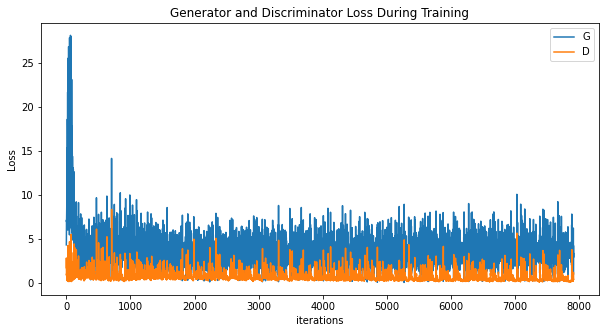

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(g_losses,label="G")
plt.plot(d_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

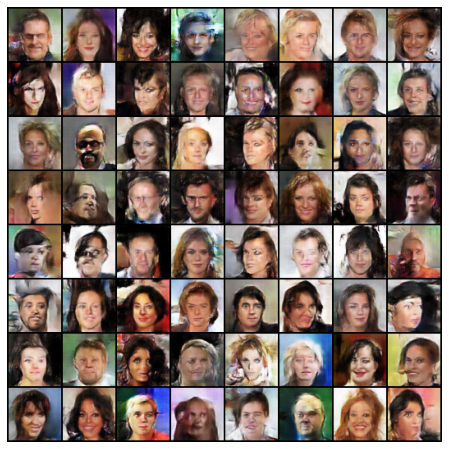

In [23]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
html = HTML(ani.to_jshtml())

In [24]:
display(html)

## Evaluate

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[[[0.0058]]]], device='cuda:0', grad_fn=<SigmoidBackward0>)


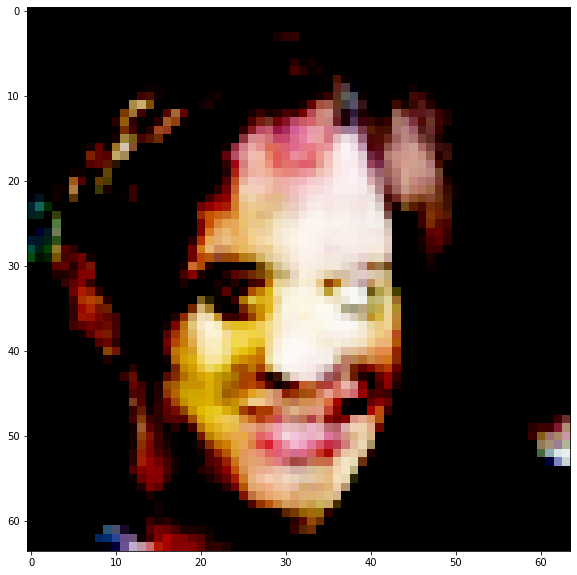

In [39]:
fake = gen(torch.randn(1, DIM_Z, 1, 1, device=device))
plt.figure(figsize=(10, 10))
plt.imshow(fake[0].permute(1, 2, 0).cpu().detach().numpy())
probs = dis(fake)
print(probs)--